<a href="https://colab.research.google.com/github/aeyeniay/AdvancedProject2/blob/main/AP_Tirta/Scenario%203/AP_Tirta_2019_2021_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1. Library

In [1]:
pip install --upgrade pandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 54.2 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 1.3.5
    Uninstalling pandas-1.3.5:
      Successfully uninstalled pandas-1.3.5


In [2]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 575.9/575.9 KB 10.4 MB/s eta 0:00:00


In [3]:
pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=65f3b4ae022e184c178095b7b465c7a7160d0adeb8cb13500bec6134fc0d8ecf
  Stored in directory: /root/.cache/pip/wheels/e6/a6/20/cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Successfully built lime


In [4]:
%matplotlib inline
from warnings import simplefilter
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error,mean_absolute_percentage_error
from sklearn.ensemble import RandomForestRegressor
import shap
import lime
from lime import lime_tabular
shap.initjs()

In [5]:
def eval(evaluation,y_true,y_train_pred,name):
  a_dict = {}
  a_dict['MAE'] = mean_absolute_error(y_true,y_train_pred)
  a_dict['MSE'] = mean_squared_error(y_true,y_train_pred)
  a_dict['MAPE']= round(mean_absolute_percentage_error(y_true,y_train_pred),6)
  a_dict['R squared'] = r2_score(y_true,y_train_pred)
  a_dict['RMSE'] = np.sqrt(mean_squared_error(y_true,y_train_pred))
  a_dict['RMSLE'] = np.log(np.sqrt(mean_squared_error(y_true,y_train_pred)))
  evaluation[name] = a_dict

## 2. Dataset

In [6]:
df = pd.read_csv(
    "Rice-Data-2018-2021.csv",
    index_col='Date',
    parse_dates=['Date'],
)

df.head()

,Average Price of Premium Quality Rice,Average Price of Medium Quality Rice,Average Price of Bad Quality Rice,Harvest Area (10^6 ha),Produksi Padi Nasional (10^6 Ton),Produksi Beras Nasional (10^6 Ton),Productivity (ku/ha)
Date,,,,,,,
2018-01-01,10349.91,10177.05,9792.59,0.54,2.78,1.59,51.48
2018-02-01,10381.74,10215.16,9987.10,1.07,5.74,3.29,53.64
2018-03-01,9892.56,9698.23,9554.06,1.77,9.68,5.55,54.69
2018-04-01,9524.96,9220.84,8991.36,1.41,7.60,4.36,53.90
2018-05-01,9523.88,9190.37,9001.50,1.00,4.90,2.81,49.00


In [7]:
df = df.iloc[12:,:]

In [8]:
df['Date'] = df.index
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d') 
df['Month'] = df['Date'].dt.month
df['Time'] = np.arange(len(df.index))
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 36 entries, 2019-01-01 to 2021-12-01
Data columns (total 10 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   Average Price of Premium Quality Rice  36 non-null     float64       
 1   Average Price of Medium Quality Rice   36 non-null     float64       
 2   Average Price of Bad Quality Rice      36 non-null     float64       
 3   Harvest Area (10^6 ha)                 36 non-null     float64       
 4   Produksi Padi Nasional (10^6 Ton)      36 non-null     float64       
 5   Produksi Beras Nasional (10^6 Ton)     36 non-null     float64       
 6   Productivity (ku/ha)                   36 non-null     float64       
 7   Date                                   36 non-null     datetime64[ns]
 8   Month                                  36 non-null     int64         
 9   Time                                   36 non-n

In [9]:
df

,Average Price of Premium Quality Rice,Average Price of Medium Quality Rice,Average Price of Bad Quality Rice,Harvest Area (10^6 ha),Produksi Padi Nasional (10^6 Ton),Produksi Beras Nasional (10^6 Ton),Productivity (ku/ha),Date,Month,Time
Date,,,,,,,,,,
2019-01-01,10111.08,9902.68,9536.30,0.41,2.04,1.17,49.76,2019-01-01,1,0
2019-02-01,10007.91,9799.57,9474.50,0.73,3.63,2.08,49.73,2019-02-01,2,1
2019-03-01,9814.53,9555.35,9271.13,1.72,9.17,5.25,53.31,2019-03-01,3,2
2019-04-01,9464.68,9144.20,8936.36,1.68,8.94,5.12,53.21,2019-04-01,4,3
2019-05-01,9462.05,9142.52,8953.33,0.92,4.37,2.50,47.50,2019-05-01,5,4
2019-06-01,9515.51,9166.40,9011.62,0.88,4.31,2.47,48.98,2019-06-01,6,5
2019-07-01,9519.35,9211.03,8931.02,0.95,4.64,2.66,48.84,2019-07-01,7,6
2019-08-01,9530.00,9224.00,9048.00,1.18,5.60,3.21,47.46,2019-08-01,8,7
2019-09-01,9594.39,9301.08,9140.60,0.80,4.23,2.43,52.88,2019-09-01,9,8


In [10]:
df.describe()

,Average Price of Premium Quality Rice,Average Price of Medium Quality Rice,Average Price of Bad Quality Rice,Harvest Area (10^6 ha),Produksi Padi Nasional (10^6 Ton),Produksi Beras Nasional (10^6 Ton),Productivity (ku/ha),Month,Time
count,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.00000,36.000000
mean,9727.516111,9335.824167,9018.168611,0.879444,4.550556,2.610833,53.344722,6.50000,17.500000
std,212.723329,292.264972,279.274130,0.427912,2.212809,1.290416,11.235960,3.50102,10.535654
min,9401.610000,8886.900000,8481.430000,0.290000,1.620000,0.930000,30.380000,1.00000,0.000000
25%,9535.370000,9139.000000,8851.825000,0.557500,3.200000,1.800000,48.970000,3.75000,8.750000
50%,9728.330000,9358.795000,9000.310000,0.795000,4.110000,2.415000,52.115000,6.50000,17.500000
75%,9883.077500,9523.145000,9170.385000,1.097500,4.857500,3.187500,54.727500,9.25000,26.250000
max,10111.080000,9902.680000,9536.300000,1.860000,9.670000,5.600000,86.380000,12.00000,35.000000


# 3. Exploratory Data Analysis (EDA)

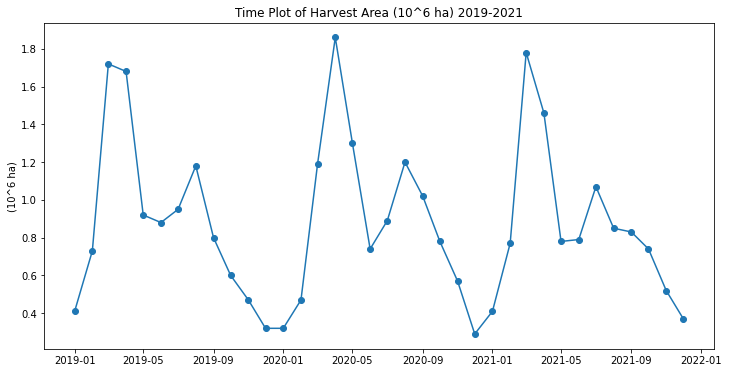

In [11]:
fig = plt.figure(figsize=(12, 6))
plt.plot(df['Harvest Area (10^6 ha)'],marker='o') 
plt.title('Time Plot of Harvest Area (10^6 ha) 2019-2021')
plt.ylabel("(10^6 ha)")
plt.show()

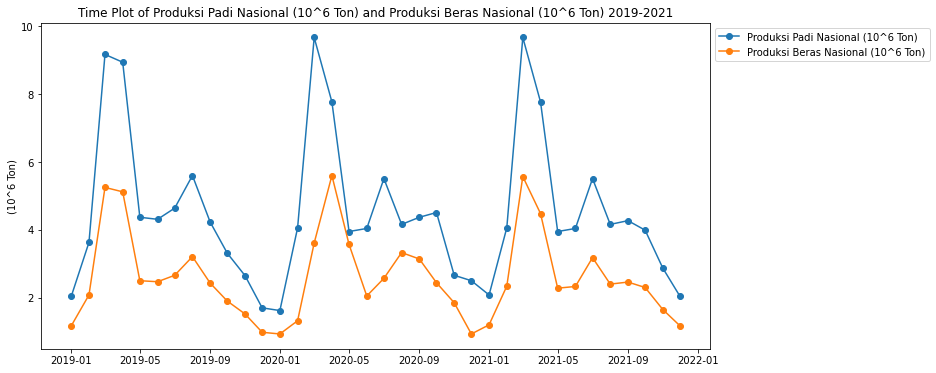

In [12]:
fig = plt.figure(figsize=(12, 6))
plt.plot(df['Produksi Padi Nasional (10^6 Ton)'],marker='o',label = 'Produksi Padi Nasional (10^6 Ton)') 
plt.plot(df['Produksi Beras Nasional (10^6 Ton)'],marker='o',label = 'Produksi Beras Nasional (10^6 Ton)') 
plt.title('Time Plot of Produksi Padi Nasional (10^6 Ton) and Produksi Beras Nasional (10^6 Ton) 2019-2021')
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.ylabel("(10^6 Ton)")
plt.show()

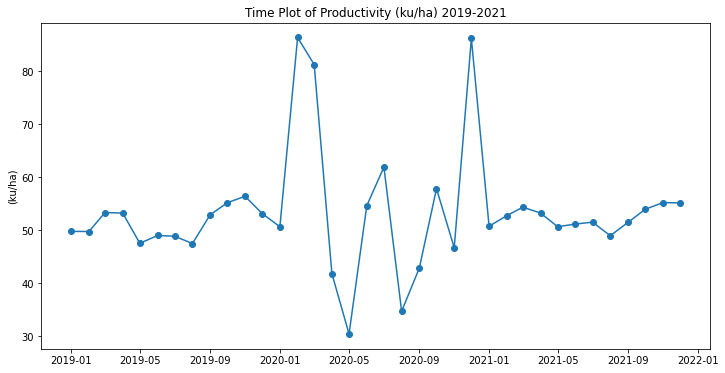

In [13]:
fig = plt.figure(figsize=(12, 6))
plt.plot(df['Productivity (ku/ha)'],marker='o') 
plt.title('Time Plot of Productivity (ku/ha) 2019-2021')
plt.ylabel("(ku/ha)")
plt.show()

In [14]:
df = df.drop(columns=['Date'])

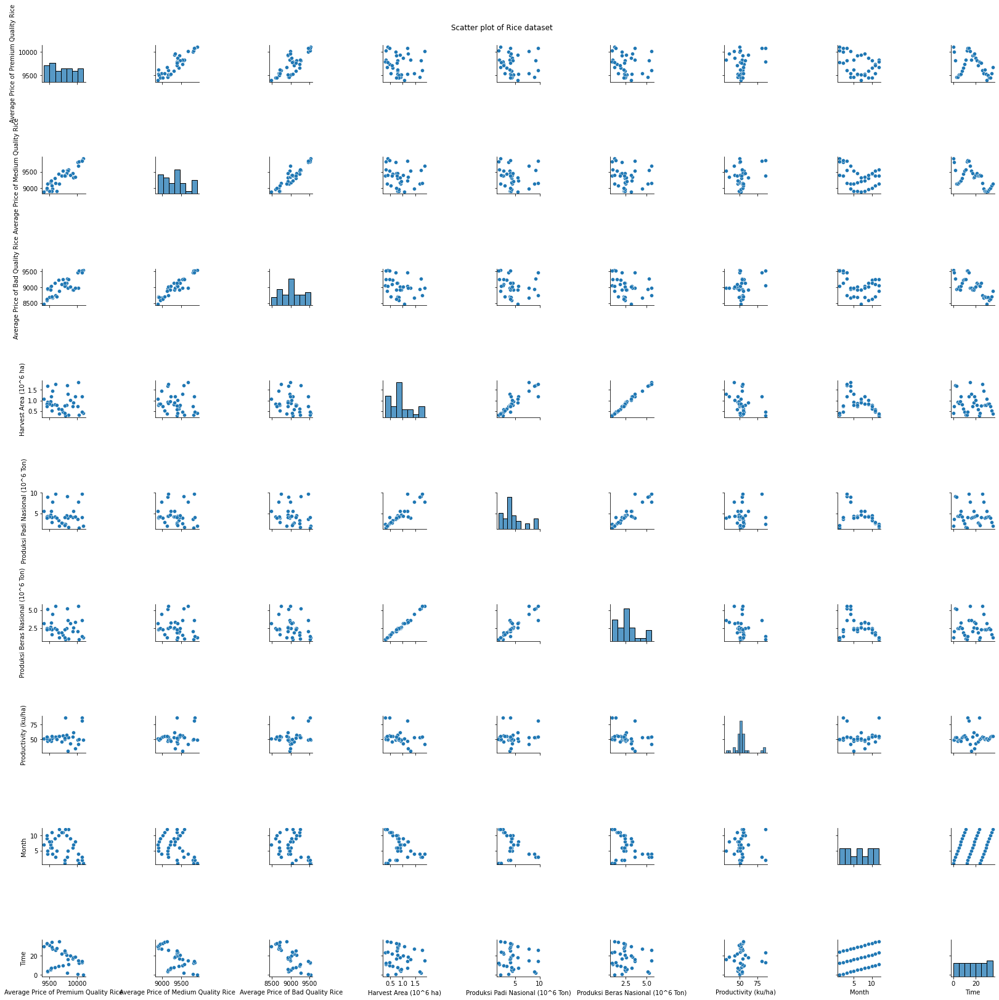

In [15]:
df_plot = df.copy()

g = sns.pairplot(df_plot)
g.fig.suptitle('Scatter plot of Rice dataset')
plt.tight_layout()
plt.show()

    From the results of the Scatter plots above, the following analysis results are obtained: 
    There are several features that have a linear relationship, 
    namely the relationship between Average Price of Premium Quality Rice, Average Price of Medium Quality Rice, and Average Price of Bad Quality Rice. 
    In addition, between harvest area, National Rice Production, and National Rice Production. 
    As well as between time and month.

# 4. Feature Engineering

## Feature Scalling (Normalization)

In [16]:
from sklearn.preprocessing import MinMaxScaler

In [17]:
mmscalar_premium = MinMaxScaler()
df[['Average Price of Premium Quality Rice']] = mmscalar_premium.fit_transform(df[['Average Price of Premium Quality Rice']])

In [18]:
mmscalar_medium = MinMaxScaler()
df[['Average Price of Medium Quality Rice']] = mmscalar_medium.fit_transform(df[['Average Price of Medium Quality Rice']])

In [19]:
mmscalar_bad = MinMaxScaler()
df[['Average Price of Bad Quality Rice']] = mmscalar_bad.fit_transform(df[['Average Price of Bad Quality Rice']])

In [20]:
mmscalar_prod = MinMaxScaler()
df[['Productivity (ku/ha)']] = mmscalar_prod.fit_transform(df[['Productivity (ku/ha)']])

##  Correlation Matrix

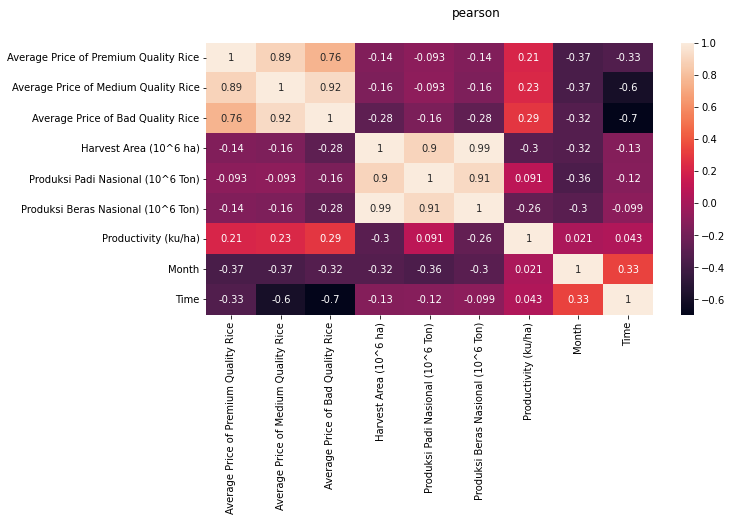

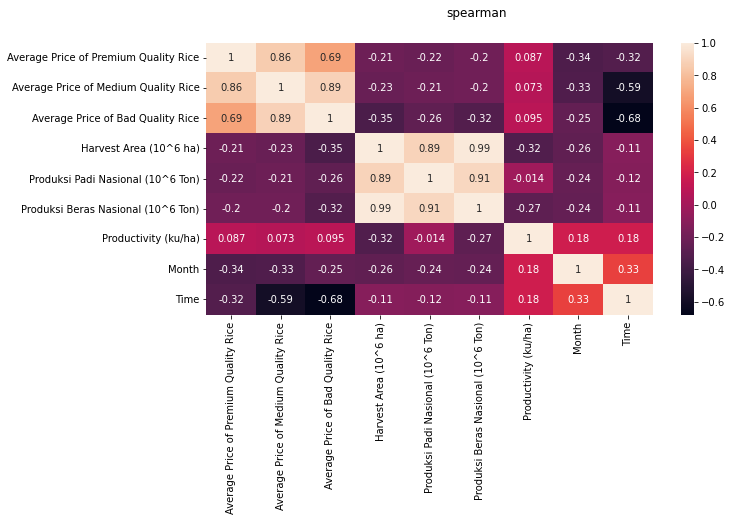

In [21]:
items = ['pearson', 'spearman']
for item in items:
    fig, axe = plt.subplots(figsize=(10,5))
    fig.suptitle(item)
    sns.heatmap(df.corr(method=item, numeric_only=True), annot=True)
    plt.show()


# 4.1 Correlation for Average Price of Premium Quality Rice

In [22]:
df.corr(method='pearson', numeric_only=True).sort_values('Average Price of Premium Quality Rice', ascending=False)['Average Price of Premium Quality Rice']

Average Price of Premium Quality Rice    1.000000
Average Price of Medium Quality Rice     0.892617
Average Price of Bad Quality Rice        0.757261
Productivity (ku/ha)                     0.212456
Produksi Padi Nasional (10^6 Ton)       -0.093068
Harvest Area (10^6 ha)                  -0.141796
Produksi Beras Nasional (10^6 Ton)      -0.144700
Time                                    -0.331576
Month                                   -0.368033
Name: Average Price of Premium Quality Rice, dtype: float64

By using Pearson, It seems like Average Price of Medium Quality Rice, Average Price of Bad Quality Rice, and Productivity (ku/ha) have a positive correlation with Average Price of Premium Quality Rice

In [23]:
df.corr(method='spearman', numeric_only=True).sort_values('Average Price of Premium Quality Rice', ascending=False)['Average Price of Premium Quality Rice']

Average Price of Premium Quality Rice    1.000000
Average Price of Medium Quality Rice     0.861776
Average Price of Bad Quality Rice        0.690862
Productivity (ku/ha)                     0.087001
Produksi Beras Nasional (10^6 Ton)      -0.195392
Harvest Area (10^6 ha)                  -0.207403
Produksi Padi Nasional (10^6 Ton)       -0.223424
Time                                    -0.315315
Month                                   -0.335401
Name: Average Price of Premium Quality Rice, dtype: float64

Using Spearman, the features correlated with the Average Price of Premium Quality Rice are similar

Text(0, 0.5, 'Average Price of Medium Quality Rice')

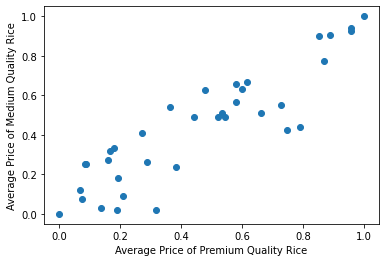

In [24]:
# Corelation between Average Price of Premium Quality Rice and Average Price of Medium Quality Rice 
plt.scatter(df['Average Price of Premium Quality Rice'], df['Average Price of Medium Quality Rice'])
plt.xlabel("Average Price of Premium Quality Rice")
plt.ylabel("Average Price of Medium Quality Rice")

Text(0, 0.5, 'Average Price of Bad Quality Rice')

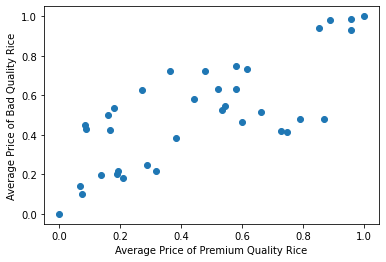

In [25]:
# Corelation between Average Price of Premium Quality Rice and Average Price of Bad Quality Rice 
plt.scatter(df['Average Price of Premium Quality Rice'], df['Average Price of Bad Quality Rice'])
plt.xlabel("Average Price of Premium Quality Rice")
plt.ylabel("Average Price of Bad Quality Rice")

Text(0, 0.5, 'Productivity (ku/ha)')

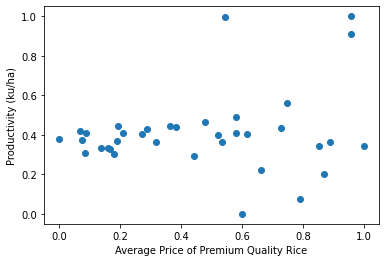

In [26]:
# Corelation between Average Price of Premium Quality Rice and Productivity (ku/ha)
plt.scatter(df['Average Price of Premium Quality Rice'], df['Productivity (ku/ha)'])
plt.xlabel("Average Price of Premium Quality Rice")
plt.ylabel("Productivity (ku/ha)")

# 4.2 Correlation for Average Price of Medium Quality Rice

In [27]:
df.corr(method='pearson', numeric_only=True).sort_values('Average Price of Medium Quality Rice', ascending=False)['Average Price of Medium Quality Rice']

Average Price of Medium Quality Rice     1.000000
Average Price of Bad Quality Rice        0.923962
Average Price of Premium Quality Rice    0.892617
Productivity (ku/ha)                     0.228019
Produksi Padi Nasional (10^6 Ton)       -0.092563
Produksi Beras Nasional (10^6 Ton)      -0.157504
Harvest Area (10^6 ha)                  -0.158175
Month                                   -0.367191
Time                                    -0.595496
Name: Average Price of Medium Quality Rice, dtype: float64

By using Pearson, It seems like Average Price of Premium Quality Rice, Average Price of Bad Quality Rice, and Productivity (ku/ha) have a positive correlation with Average Price of Medium Quality Rice

In [28]:
df.corr(method='spearman', numeric_only=True).sort_values('Average Price of Medium Quality Rice', ascending=False)['Average Price of Medium Quality Rice']

Average Price of Medium Quality Rice     1.000000
Average Price of Bad Quality Rice        0.885714
Average Price of Premium Quality Rice    0.861776
Productivity (ku/ha)                     0.072844
Produksi Beras Nasional (10^6 Ton)      -0.199897
Produksi Padi Nasional (10^6 Ton)       -0.211706
Harvest Area (10^6 ha)                  -0.229804
Month                                   -0.326105
Time                                    -0.590219
Name: Average Price of Medium Quality Rice, dtype: float64

By using spearman, most of the correlated features with Average Price of Medium Quality Rice Rice are similar

Text(0, 0.5, 'Average Price of Bad Quality Rice')

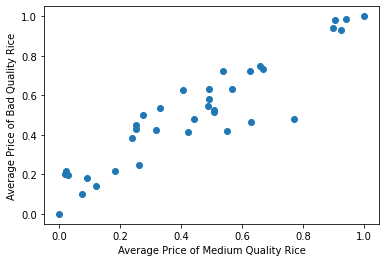

In [29]:
# Corelation between Average Price of Medium Quality Rice and Average Price of Bad Quality Rice 
plt.scatter(df['Average Price of Medium Quality Rice'], df['Average Price of Bad Quality Rice'])
plt.xlabel("Average Price of Medium Quality Rice")
plt.ylabel("Average Price of Bad Quality Rice")

Text(0, 0.5, 'Average Price of Premium Quality Rice')

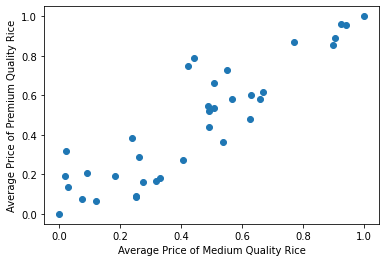

In [30]:
# Corelation between Average Price of Medium Quality Rice and Average Price of Premium Quality Rice 
plt.scatter(df['Average Price of Medium Quality Rice'], df['Average Price of Premium Quality Rice'])
plt.xlabel("Average Price of Medium Quality Rice")
plt.ylabel("Average Price of Premium Quality Rice")

Text(0, 0.5, 'Productivity (ku/ha)')

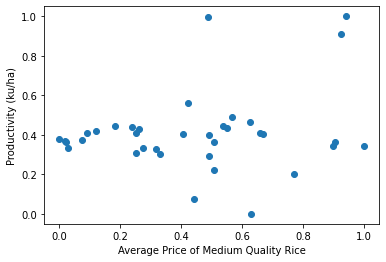

In [31]:
# Corelation between Average Price of Medium Quality Rice and Productivity (ku/ha)
plt.scatter(df['Average Price of Medium Quality Rice'], df['Productivity (ku/ha)'])
plt.xlabel("Average Price of Medium Quality Rice")
plt.ylabel("Productivity (ku/ha)")

# 4.3 Correlation for Average Price of Bad Quality Rice

In [32]:
df.corr(method='pearson', numeric_only=True).sort_values('Average Price of Bad Quality Rice', ascending=False)['Average Price of Bad Quality Rice']

Average Price of Bad Quality Rice        1.000000
Average Price of Medium Quality Rice     0.923962
Average Price of Premium Quality Rice    0.757261
Productivity (ku/ha)                     0.285900
Produksi Padi Nasional (10^6 Ton)       -0.164253
Produksi Beras Nasional (10^6 Ton)      -0.277309
Harvest Area (10^6 ha)                  -0.278471
Month                                   -0.323123
Time                                    -0.695642
Name: Average Price of Bad Quality Rice, dtype: float64

By using Pearson, It seems like Average Price of Premium Quality Rice, Average Price of Medium Quality Rice, and Productivity (ku/ha) have a positive correlation with Average Price of Bad Quality Rice

In [33]:
df.corr(method='spearman', numeric_only=True).sort_values('Average Price of Bad Quality Rice', ascending=False)['Average Price of Bad Quality Rice']

Average Price of Bad Quality Rice        1.000000
Average Price of Medium Quality Rice     0.885714
Average Price of Premium Quality Rice    0.690862
Productivity (ku/ha)                     0.094981
Month                                   -0.248646
Produksi Padi Nasional (10^6 Ton)       -0.263988
Produksi Beras Nasional (10^6 Ton)      -0.315999
Harvest Area (10^6 ha)                  -0.346830
Time                                    -0.678764
Name: Average Price of Bad Quality Rice, dtype: float64

By using spearman, most of the correlated features with Average Price of Bad Quality Rice Rice are similar

Text(0.5, 0, 'Average Price of Bad Quality Rice')

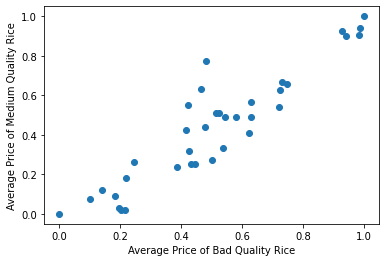

In [34]:
# Corelation between Average Price of Bad Quality Rice and Average Price of Medium Quality Rice 
plt.scatter(df['Average Price of Bad Quality Rice'], df['Average Price of Medium Quality Rice'])
plt.ylabel("Average Price of Medium Quality Rice")
plt.xlabel("Average Price of Bad Quality Rice")

Text(0, 0.5, 'Average Price of Premium Quality Rice')

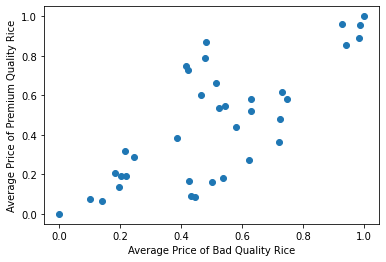

In [35]:
# Corelation between Average Price of Bad Quality Rice and Average Price of Premium Quality Rice 
plt.scatter(df['Average Price of Bad Quality Rice'], df['Average Price of Premium Quality Rice'])
plt.xlabel("Average Price of Bad Quality Rice")
plt.ylabel("Average Price of Premium Quality Rice")

Text(0, 0.5, 'Productivity (ku/ha)')

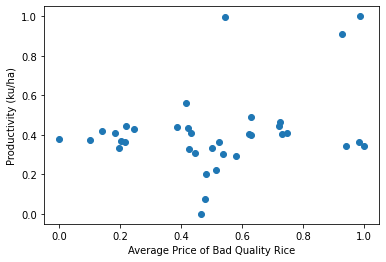

In [36]:
# Corelation between Average Price of Bad Quality Rice and Productivity (ku/ha)
plt.scatter(df['Average Price of Bad Quality Rice'], df["Productivity (ku/ha)"])
plt.xlabel("Average Price of Bad Quality Rice")
plt.ylabel("Productivity (ku/ha)")

# 5. Split dataset to train and test datasets
    df_train is rice data from 2019-2020
    df_test is rice data in 2021

In [37]:
df_train = df.iloc[:24,:]
df_test = df.iloc[24:,:]

In [38]:
# Training data
Time_train = df_train.loc[:, ['Time']]  # features
Monthly_train = df_train.loc[:, ['Month']]  # features
x_premium_train = df_train.loc[:, df_train.columns != 'Average Price of Premium Quality Rice'] # features
x_medium_train = df_train.loc[:, df_train.columns != 'Average Price of Medium Quality Rice'] # features
x_bad_train = df_train.loc[:, df_train.columns != 'Average Price of Bad Quality Rice'] # features
HargaBerasPremium_train = df_train.loc[:, 'Average Price of Premium Quality Rice']  # target
HargaBerasMedium_train = df_train.loc[:, 'Average Price of Medium Quality Rice']  # target
HargaBerasLuarkualitas_train = df_train.loc[:, 'Average Price of Bad Quality Rice'] # target

In [39]:
# Test Data
Time_test = df_test.loc[:, ['Time']]  # features
Monthly_test = df_test.loc[:, ['Month']]  # features
x_premium_test = df_test.loc[:, df_test.columns != 'Average Price of Premium Quality Rice'] # features
x_medium_test = df_test.loc[:, df_test.columns != 'Average Price of Medium Quality Rice'] # features
x_bad_test = df_test.loc[:, df_test.columns != 'Average Price of Bad Quality Rice'] # features
HargaBerasPremium_test = df_test.loc[:, 'Average Price of Premium Quality Rice']  # target
HargaBerasMedium_test = df_test.loc[:, 'Average Price of Medium Quality Rice']  # target
HargaBerasLuarkualitas_test = df_test.loc[:, 'Average Price of Bad Quality Rice'] # target

In [40]:
evaluation_train = {}
evaluation_test = {}

### SIMPLE LINEAR REGRESSION
### Average Price of Premium Quality Rice

In [41]:
# Train the model
model = LinearRegression()
model.fit(Time_train, HargaBerasPremium_train)

# Koefisien model
print ('Coefficients: ', model.coef_)
print ('Intercept: ',model.intercept_)
accuracy = model.score(Time_train, HargaBerasPremium_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [0.01198747]
Intercept:  0.42951888968760743
Model Accuracy:  0.0833756662491647


Predicting on Train Data

In [42]:
AvgPricePremium_train = pd.Series(model.predict(Time_train), index=Time_train.index)

eval(evaluation_train,HargaBerasPremium_train,AvgPricePremium_train,'Train SLR Premium')

Predicting on Test Data

In [43]:
AvgPricePremium_pred = pd.Series(model.predict(Time_test), index=Time_test.index)

eval(evaluation_test,HargaBerasPremium_test,AvgPricePremium_pred,'Test SLR Premium')

### Multiple Linear Regression
### Average Price of Premium Quality Rice

In [44]:
regr = LinearRegression()
regr.fit(x_premium_train,HargaBerasPremium_train)

print('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

accuracy = regr.score(x_premium_train,HargaBerasPremium_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [ 1.33106668 -0.38872708  0.289951    0.03688239 -0.16529251 -0.14921337
 -0.01125799  0.01420755]
Intercept:  0.023690398226272058
Model Accuracy:  0.8997506898369754


Predicting on Train Data

In [45]:
AvgPricePremium_train_v2 = pd.Series(regr.predict(x_premium_train), index=x_premium_train.index)

eval(evaluation_train,HargaBerasPremium_train,AvgPricePremium_train_v2,'Train MLR Premium')

Predicting on Test Data

In [46]:
AvgPricePremium_pred_v2 = pd.Series(regr.predict(x_premium_test), index=x_premium_test.index)

eval(evaluation_test,HargaBerasPremium_test,AvgPricePremium_pred_v2,'Test MLR Premium')

explain the model's predictions using SHAP

Shapley on Train Data

In [47]:
explainer = shap.Explainer(regr, x_premium_train)
shap_values = explainer(x_premium_train)

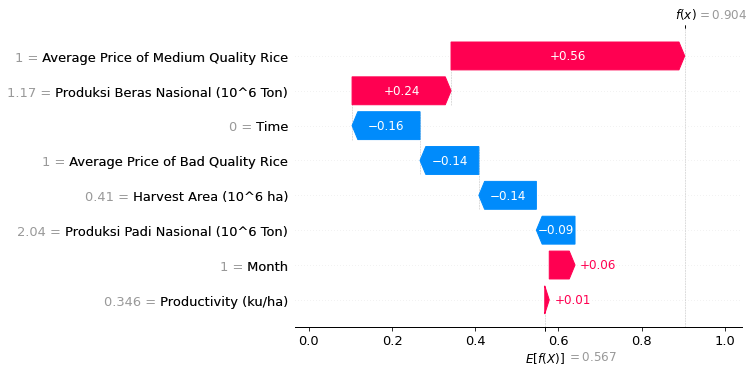

In [48]:
shap.plots.waterfall(shap_values[0])

In [49]:
shap_values = explainer.shap_values(x_premium_train)

In [50]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_premium_train,link="logit")

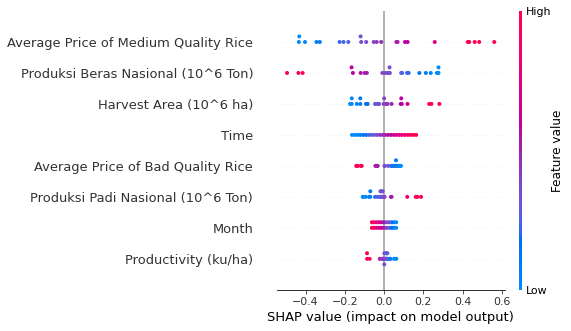

In [51]:
shap.summary_plot(shap_values, x_premium_train)

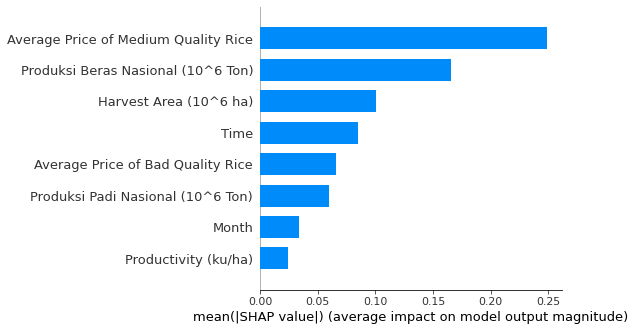

In [52]:
shap.summary_plot(shap_values, x_premium_train, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Premium Quality Rice is  Average Price of Medium Quality Rice. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [53]:
explainer = shap.Explainer(regr, x_premium_test)
shap_values = explainer(x_premium_test)

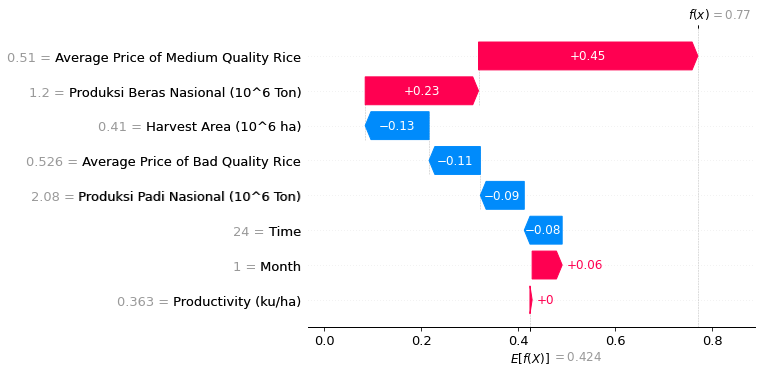

In [54]:
shap.plots.waterfall(shap_values[0])

In [55]:
shap_values = explainer.shap_values(x_premium_test)

In [56]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_premium_test,link="logit")

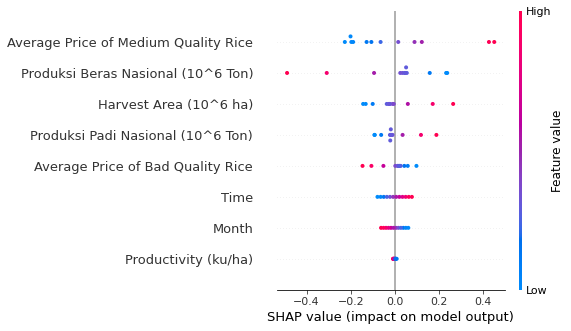

In [57]:
shap.summary_plot(shap_values, x_premium_test)

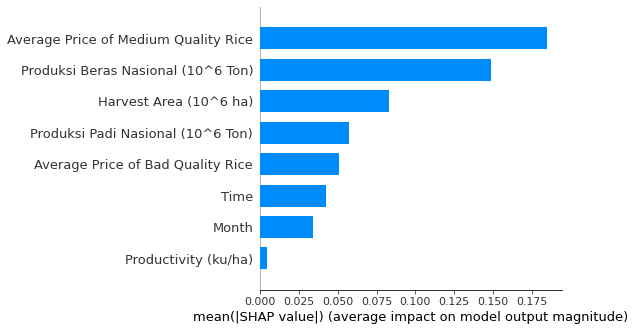

In [58]:
shap.summary_plot(shap_values, x_premium_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Premium Quality Rice is  Average Price of Medium Quality Rice. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

## explain the model's predictions using Lime

In [59]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_premium_train.values, feature_names=x_premium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Premium Quality Rice'], verbose=True, mode='regression')

In [60]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_premium_test.values[j], regr.predict, num_features=len(x_premium_test.columns.values.tolist()))

Intercept 0.5905922924766118
Prediction_local [0.49905329]
Right: 0.2530033365455623


X does not have valid feature names, but LinearRegression was fitted with feature names


In [61]:
# Show the predictions
exp.show_in_notebook(show_table=True)

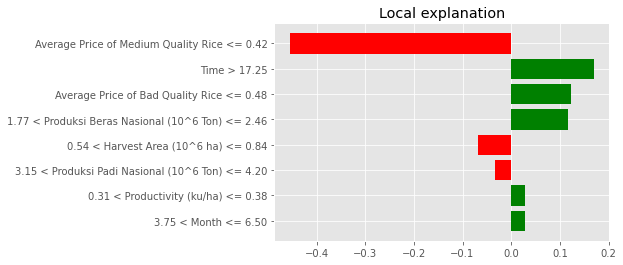

In [62]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [63]:
exp.as_list()

[('Average Price of Medium Quality Rice <= 0.42', -0.4551487380146829),
 ('Time > 17.25', 0.17025199658370885),
 ('Average Price of Bad Quality Rice <= 0.48', 0.12197376780090505),
 ('1.77 < Produksi Beras Nasional (10^6 Ton) <= 2.46', 0.11766120727721427),
 ('0.54 < Harvest Area (10^6 ha) <= 0.84', -0.06788379834922526),
 ('3.15 < Produksi Padi Nasional (10^6 Ton) <= 4.20', -0.03399073686134305),
 ('0.31 < Productivity (ku/ha) <= 0.38', 0.028083192745843095),
 ('3.75 < Month <= 6.50', 0.027514105312932153)]

## Random Forest
### Average Price of Premium Quality Rice

In [64]:
# Train the model
regressor = RandomForestRegressor(n_estimators = 1000, random_state=42)
regressor.fit(x_premium_train,HargaBerasPremium_train)

accuracy = regressor.score(x_premium_train,HargaBerasPremium_train)
print("Model Accuracy: ", accuracy)

Model Accuracy:  0.9686856710983255


Predicting on Train Data

In [65]:
AvgPricePremium_train_with_randomforest = pd.Series(regressor.predict(x_premium_train), index=x_premium_train.index)

eval(evaluation_train,HargaBerasPremium_train,AvgPricePremium_train_with_randomforest,'Train RF Premium')

Predicting on Test Data

In [66]:
AvgPricePremium_pred_with_randomforest = pd.Series(regressor.predict(x_premium_test), index=x_premium_test.index)

eval(evaluation_test,HargaBerasPremium_test,AvgPricePremium_pred_with_randomforest,'Test RF Premium')

# explain the model's predictions using SHAP

In [67]:
explainer = shap.TreeExplainer(regressor)

Shap Explanation at Train Data

In [68]:
shap_values = explainer.shap_values(x_premium_train)

In [69]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values,x_premium_train,link="logit")

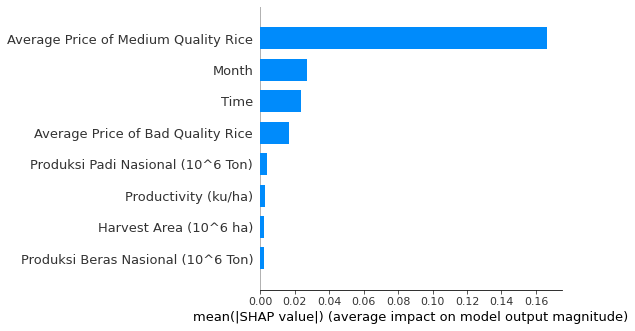

In [70]:
shap.summary_plot(shap_values, x_premium_train, plot_type="bar")

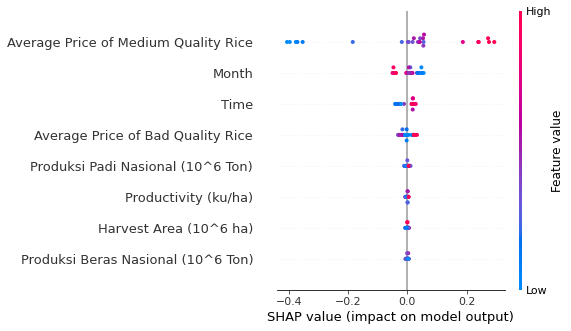

In [71]:
shap.summary_plot(shap_values, x_premium_train)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Premium Quality Rice is  Average Price of Medium Quality Rice. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shap Explanation at Test Data

In [72]:
shap_values = explainer.shap_values(x_premium_test)

In [73]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values,x_premium_test,link="logit")

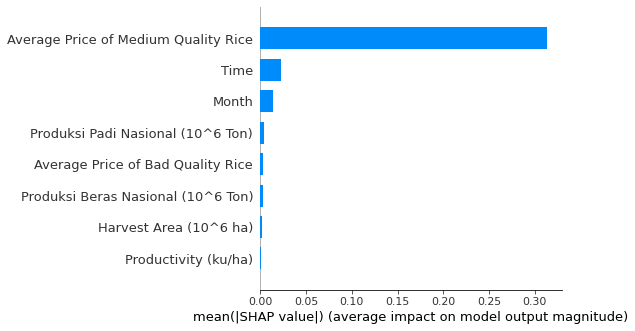

In [74]:
shap.summary_plot(shap_values, x_premium_test, plot_type="bar")

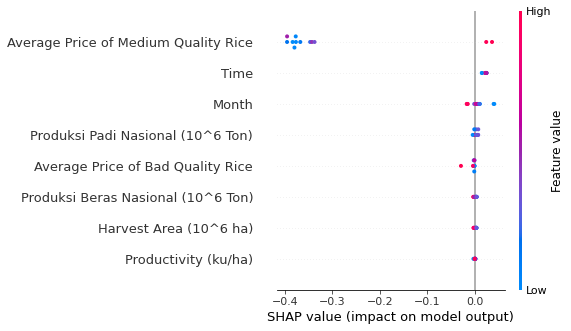

In [75]:
shap.summary_plot(shap_values, x_premium_test)

    The feature important that has the largest average SHAP value in the Random Forest method on Premium Quality Rice is Average Price of Medium Quality Rice. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

### explain the model's predictions using Lime

In [76]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_premium_train.values, feature_names=x_premium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Premium Quality Rice'], verbose=True, mode='regression')

In [77]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_premium_test.values[j], regressor.predict, num_features=len(x_premium_test.columns.values.tolist()))

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Intercept 0.6558650020719706
Prediction_local [0.27652237]
Right: 0.23498102809139507


In [78]:
# Show the predictions
exp.show_in_notebook(show_table=True)

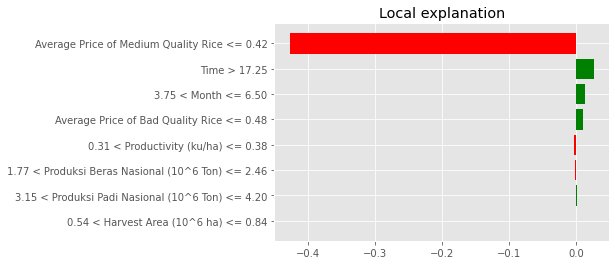

In [79]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [80]:
exp.as_list()

[('Average Price of Medium Quality Rice <= 0.42', -0.4274853491488011),
 ('Time > 17.25', 0.02702524100692674),
 ('3.75 < Month <= 6.50', 0.013354860591374012),
 ('Average Price of Bad Quality Rice <= 0.48', 0.010546814617037114),
 ('0.31 < Productivity (ku/ha) <= 0.38', -0.0025274510009268437),
 ('1.77 < Produksi Beras Nasional (10^6 Ton) <= 2.46', -0.002107852427183236),
 ('3.15 < Produksi Padi Nasional (10^6 Ton) <= 4.20', 0.0014992748105346276),
 ('0.54 < Harvest Area (10^6 ha) <= 0.84', 0.00035182883415311225)]

### SIMPLE LINEAR REGRESSION
### Average Price of Medium Quality Rice

In [81]:
# Train the model
model2 = LinearRegression()
model2.fit(Time_train, HargaBerasMedium_train)

# Koefisien model
print ('Coefficients: ', model2.coef_)
print ('Intercept: ',model2.intercept_)

Coefficients:  [-0.00090045]
Intercept:  0.5882390543884172


Predicting on Train Data

In [82]:
AvgPriceMedium_train = pd.Series(model2.predict(Time_train), index=Time_train.index)

eval(evaluation_train,HargaBerasMedium_train,AvgPriceMedium_train,'Train SLR Medium')

Predicting on Test Data

In [83]:
AvgPriceMedium_pred = pd.Series(model2.predict(Time_test), index=Time_test.index)

eval(evaluation_test,HargaBerasMedium_test,AvgPriceMedium_pred,'Test SLR Medium')

### Multiple Linear Regression
### Average Price of Medium Quality Rice

In [84]:
regr_v2 = LinearRegression()
regr_v2.fit(x_medium_train, HargaBerasMedium_train)

print('Coefficients: ', regr_v2.coef_)
print ('Intercept: ',regr_v2.intercept_)

accuracy = regr_v2.score(x_medium_train,HargaBerasMedium_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [ 0.4302224   0.61763649 -0.10789286 -0.03882726  0.11135345  0.11075759
 -0.00368869 -0.00096887]
Intercept:  -0.08823336488720002
Model Accuracy:  0.9475140265566709


Predicting on Train Data

In [85]:
AvgPriceMedium_train_v2 = pd.Series(regr_v2.predict(x_medium_train), index=x_medium_train.index)

eval(evaluation_train,HargaBerasMedium_train,AvgPriceMedium_train_v2,'Train MLR Medium')

Predicting on Test Data

In [86]:
AvgPriceMedium_pred_v2 = pd.Series(regr_v2.predict(x_medium_test), index=x_medium_test.index)

eval(evaluation_test,HargaBerasMedium_test,AvgPriceMedium_pred_v2,'Test MLR Medium')

explain the model's predictions using SHAP

Shapley on Train Data

In [87]:
explainer = shap.LinearExplainer(regr_v2, x_medium_train)
shap_values = explainer(x_medium_train)

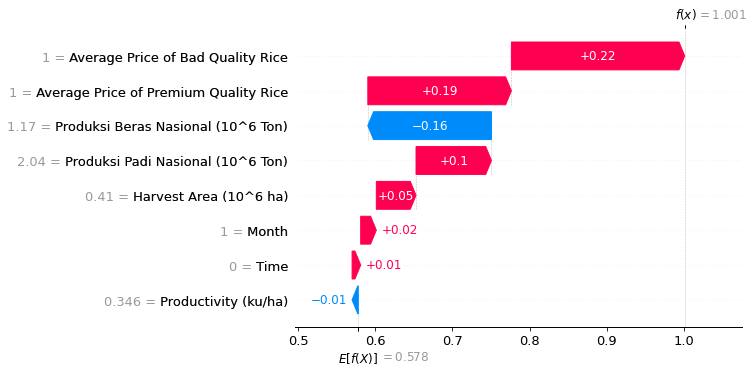

In [88]:
shap.plots.waterfall(shap_values[0])

In [89]:
shap_values_v2 = explainer.shap_values(x_medium_train)

In [90]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values_v2, x_medium_train,link="logit")

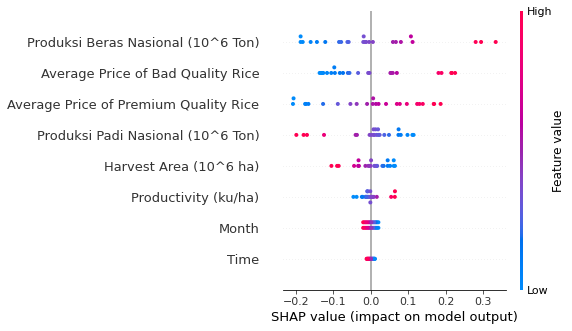

In [91]:
shap.summary_plot(shap_values_v2, x_medium_train)

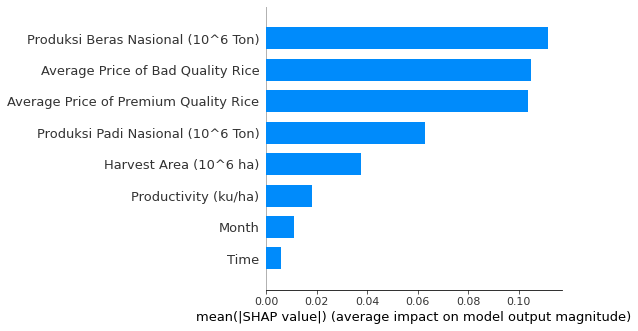

In [92]:
shap.summary_plot(shap_values_v2, x_medium_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Medium Quality Rice is  Produksi Beras Nasional. High values of the Produksi Beras Nasional variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [93]:
explainer_v2 = shap.LinearExplainer(regr_v2, x_medium_test)
shap_values_v2 = explainer_v2(x_medium_test)

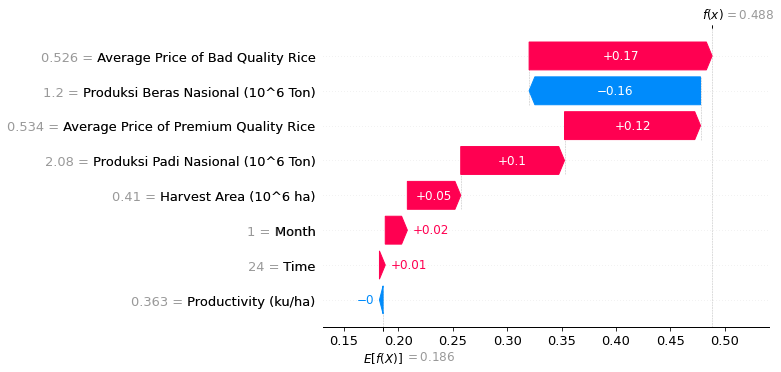

In [94]:
shap.plots.waterfall(shap_values_v2[0])

In [95]:
shap_values_v2 = explainer_v2.shap_values(x_medium_test)

In [96]:
shap.initjs()
shap.force_plot(explainer_v2.expected_value, shap_values_v2, x_medium_test,link="logit")

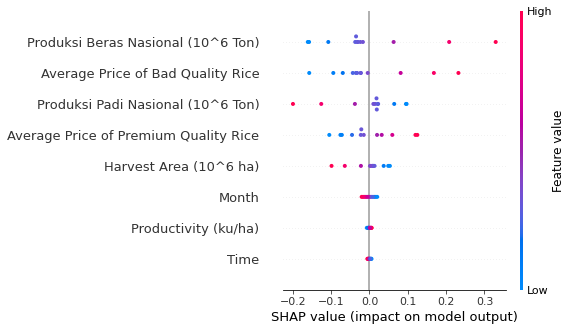

In [97]:
shap.summary_plot(shap_values_v2, x_medium_test)

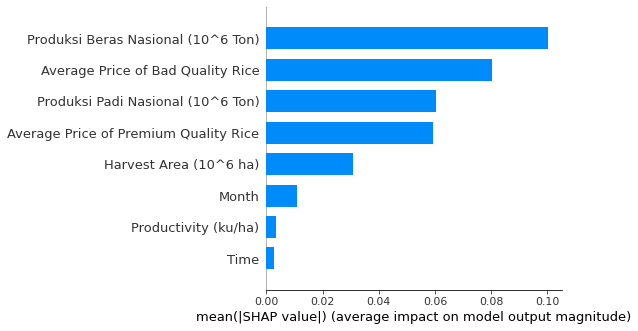

In [98]:
shap.summary_plot(shap_values_v2, x_medium_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Medium Quality Rice is  Produksi Beras Nasional. High values of the Produksi Beras Nasional variable have a high positive contribution on the prediction, while low values have a high negative contribution.

## explain the model's predictions using Lime

In [99]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_medium_train.values, feature_names=x_medium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Medium Quality Rice'], verbose=True, mode='regression')

In [100]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_medium_test.values[j], regr_v2.predict, num_features=len(x_medium_test.columns.values.tolist()))

Intercept 0.6819010374255196
Prediction_local [0.24931143]
Right: 0.12716821058354424


X does not have valid feature names, but LinearRegression was fitted with feature names


In [101]:
# Show the predictions
exp.show_in_notebook(show_table=True)

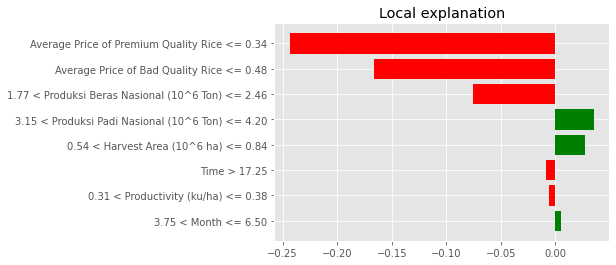

In [102]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [103]:
exp.as_list()

[('Average Price of Premium Quality Rice <= 0.34', -0.2435761496557211),
 ('Average Price of Bad Quality Rice <= 0.48', -0.16636513472064235),
 ('1.77 < Produksi Beras Nasional (10^6 Ton) <= 2.46', -0.07521442161702416),
 ('3.15 < Produksi Padi Nasional (10^6 Ton) <= 4.20', 0.03540408117715576),
 ('0.54 < Harvest Area (10^6 ha) <= 0.84', 0.02724242644306096),
 ('Time > 17.25', -0.009009518181145487),
 ('0.31 < Productivity (ku/ha) <= 0.38', -0.005838328179811477),
 ('3.75 < Month <= 6.50', 0.004767437349259026)]

## Random Forest
### Average Price of Medium Quality Rice

In [104]:
# Train the model
regressor2 = RandomForestRegressor(n_estimators = 1000, random_state=42)
regressor2.fit(x_medium_train, HargaBerasMedium_train)

accuracy = regressor2.score(x_medium_train, HargaBerasMedium_train)
print("Model Accuracy: ", accuracy)

Model Accuracy:  0.9843083821279286


Predicting on Train Data

In [105]:
AvgPriceMedium_train_with_randomforest = pd.Series(regressor2.predict(x_medium_train), index=x_medium_train.index)

eval(evaluation_train,HargaBerasMedium_train,AvgPriceMedium_train_with_randomforest,'Train RF Medium')

Predicting on Test Data

In [106]:
AvgPriceMedium_pred_with_randomforest = pd.Series(regressor2.predict(x_medium_test), index=x_medium_test.index)

eval(evaluation_test,HargaBerasMedium_test,AvgPriceMedium_pred_with_randomforest,'Test RF Medium')

Explain the model's predictions using SHAP

In [107]:
explainer = shap.TreeExplainer(regressor2)

Shapley on Train Data

In [108]:
shap_values = explainer.shap_values(x_medium_train)

In [109]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_medium_train,link="logit")

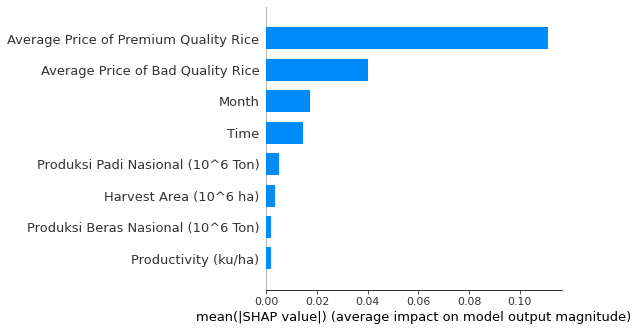

In [110]:
shap.summary_plot(shap_values, x_medium_train, plot_type="bar")

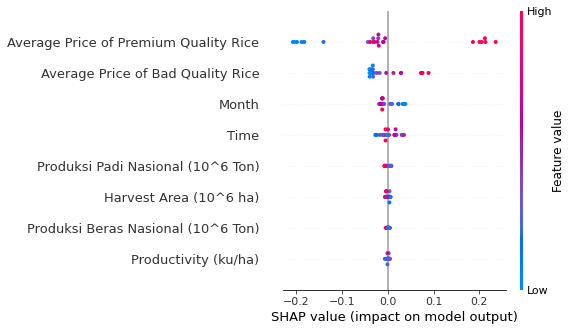

In [111]:
shap.summary_plot(shap_values, x_medium_train)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Medium Quality Rice is  Average Price of Premium Quality Rice. High values of the Average Price of Premium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [112]:
shap_values = explainer.shap_values(x_medium_test)

In [113]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_medium_test,link="logit")

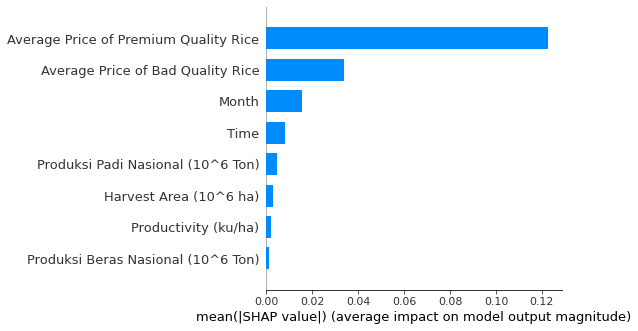

In [114]:
shap.summary_plot(shap_values, x_medium_test, plot_type="bar")

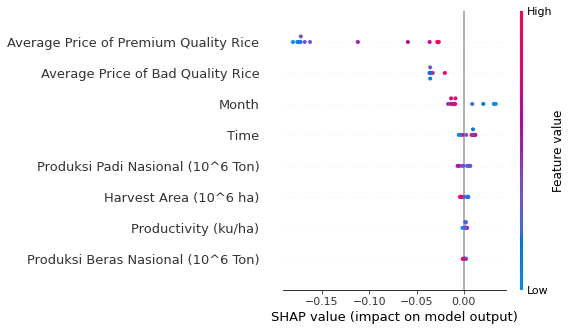

In [115]:
shap.summary_plot(shap_values, x_medium_test)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Medium Quality Rice is  Average Price of Premium Quality Rice. 

## explain the model's predictions using Lime

In [116]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_medium_train.values, feature_names=x_medium_train.columns.values.tolist(),
                                                  class_names=['Average Price of Medium Quality Rice'], verbose=True, mode='regression')

In [117]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_medium_test.values[j], regressor2.predict, num_features=len(x_medium_test.columns.values.tolist()))

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Intercept 0.6433997360481349
Prediction_local [0.37826574]
Right: 0.37854698852113494


In [118]:
# Show the predictions
exp.show_in_notebook(show_table=True)

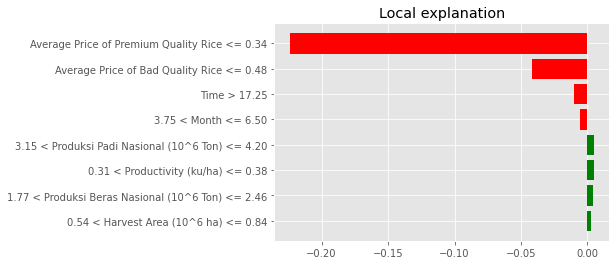

In [119]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [120]:
exp.as_list()

[('Average Price of Premium Quality Rice <= 0.34', -0.22399619281405547),
 ('Average Price of Bad Quality Rice <= 0.48', -0.041901581530920815),
 ('Time > 17.25', -0.009778542690123872),
 ('3.75 < Month <= 6.50', -0.005763910645239963),
 ('3.15 < Produksi Padi Nasional (10^6 Ton) <= 4.20', 0.004949414593715373),
 ('0.31 < Productivity (ku/ha) <= 0.38', 0.0046501211548578315),
 ('1.77 < Produksi Beras Nasional (10^6 Ton) <= 2.46', 0.0040369165168107),
 ('0.54 < Harvest Area (10^6 ha) <= 0.84', 0.0026697791557481402)]

### SIMPLE LINEAR REGRESSION
### Average Price of Bad Quality Rice

In [121]:
# Train the model
model3 = LinearRegression()
model3.fit(Time_train, HargaBerasLuarkualitas_train)

# Koefisien model
print ('Coefficients: ', model3.coef_)
print ('Intercept: ',model3.intercept_)

accuracy = model3.score(Time_train,HargaBerasLuarkualitas_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [-0.008318]
Intercept:  0.7318282505585216
Model Accuracy:  0.08475109763276922


Predicting on Train Data

In [122]:
AvgPriceBad_train = pd.Series(model3.predict(Time_train), index=Time_train.index)

eval(evaluation_train,HargaBerasLuarkualitas_train,AvgPriceBad_train,'Train SLR Bad')

Predicting on Test Data

In [123]:
AvgPriceBad_pred = pd.Series(model3.predict(Time_test), index=Time_test.index)

eval(evaluation_test,HargaBerasLuarkualitas_test,AvgPriceBad_pred,'Test SLR Bad')

### Multiple Linear Regression
### Average Price of Bad Quality Rice

In [124]:
regr_v3 = LinearRegression()
regr_v3.fit(x_bad_train,HargaBerasLuarkualitas_train)

print('Coefficients: ', regr_v3.coef_)
print ('Intercept: ',regr_v3.intercept_)

accuracy = regr_v3.score(x_bad_train,HargaBerasLuarkualitas_train)
print("Model Accuracy: ", accuracy)

Coefficients:  [-0.1669102   0.82049854 -0.54292439  0.04165064  0.07378402 -0.08696782
 -0.001073   -0.00588205]
Intercept:  0.46692513820310133
Model Accuracy:  0.9091254084835223


Predicting on Train Data

In [125]:
AvgPriceBad_train_v2 = pd.Series(regr_v3.predict(x_bad_train), index=x_bad_train.index)

eval(evaluation_train,HargaBerasLuarkualitas_train,AvgPriceBad_train_v2,'Train MLR Bad')

Predicting on Test Data

In [126]:
AvgPriceBad_pred_v2 = pd.Series(regr_v3.predict(x_bad_test), index=x_bad_test.index)

eval(evaluation_test,HargaBerasLuarkualitas_test,AvgPriceBad_pred_v2,'Test MLR Bad')

Explain the model's predictions using SHAP

Shapley on Train Data

In [127]:
explainer = shap.LinearExplainer(regr_v3, x_bad_train)
shap_values = explainer(x_bad_train)

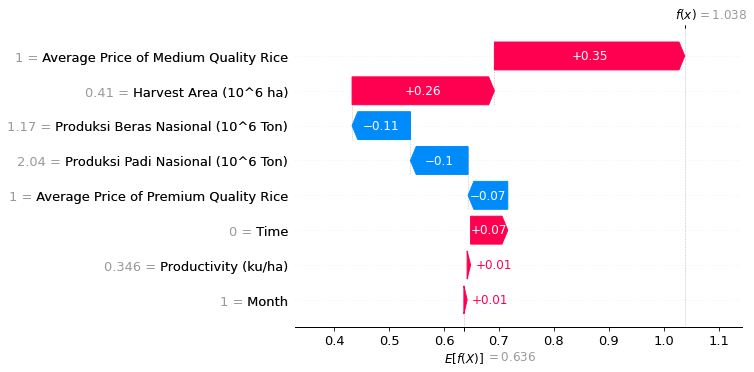

In [128]:
shap.plots.waterfall(shap_values[0])

In [129]:
shap_values = explainer.shap_values(x_bad_train)

In [130]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_bad_train,link="logit")

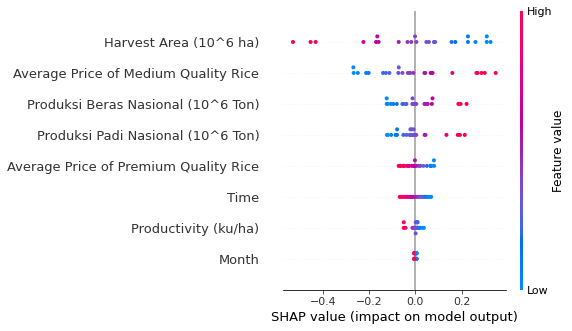

In [131]:
shap.summary_plot(shap_values, x_bad_train)

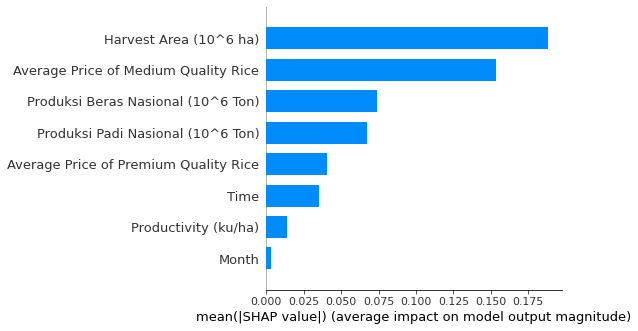

In [132]:
shap.summary_plot(shap_values, x_bad_train, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Bad Quality Rice is Harvest Area. High values of the Harvest Area variable have a high negative contribution on the prediction, while low values have a high positive contribution.

Shapley on Test Data

In [133]:
explainer_v3 = shap.LinearExplainer(regr_v3, x_bad_test)
shap_values_v3 = explainer_v3(x_bad_test)

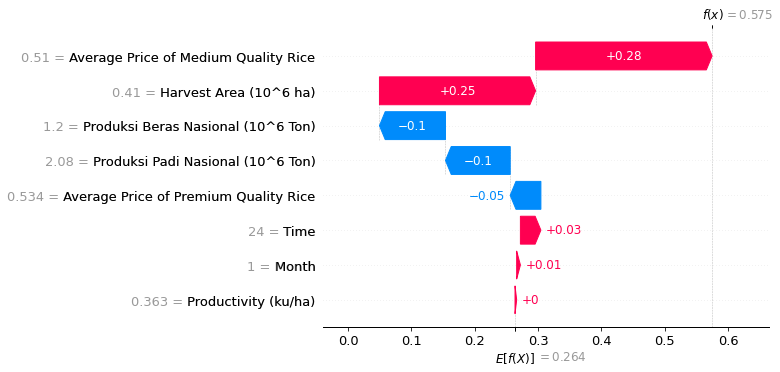

In [134]:
shap.plots.waterfall(shap_values_v3[0])

In [135]:
shap_values_v3 = explainer_v3.shap_values(x_bad_test)

In [136]:
shap.initjs()
shap.force_plot(explainer_v3.expected_value, shap_values_v3, x_bad_test,link="logit")

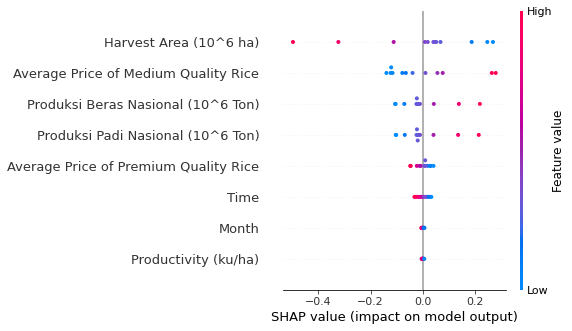

In [137]:
shap.summary_plot(shap_values_v3, x_bad_test)

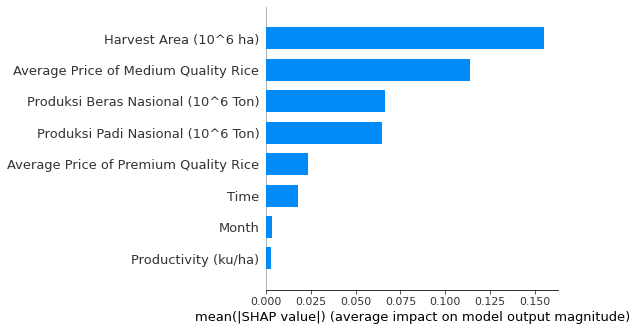

In [138]:
shap.summary_plot(shap_values_v3, x_bad_test, plot_type ="bar")

    The feature important that has the largest average SHAP value in the Multiple Linear Regression method on Average Price of Bad Quality Rice is Harvest Area. High values of the Harvest Area variable have a high negative contribution on the prediction, while low values have a high positive contribution.

### explain the model's predictions using Lime

In [139]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_bad_train.values, feature_names=x_bad_train.columns.values.tolist(),
                                                  class_names=['Average Price of Bad Quality Rice'], verbose=True, mode='regression')

In [140]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_bad_test.values[j], regr_v3.predict, num_features=len(x_bad_test.columns.values.tolist()))

Intercept 0.6795436069208266
Prediction_local [0.47408536]
Right: 0.15302217340195834


X does not have valid feature names, but LinearRegression was fitted with feature names


In [141]:
# Show the predictions
exp.show_in_notebook(show_table=True)

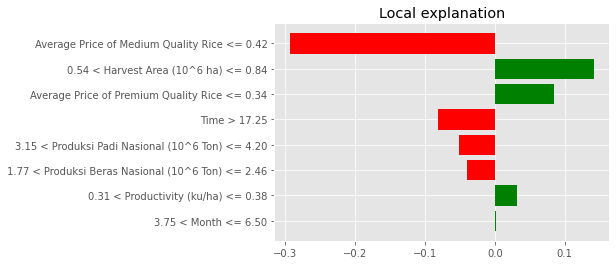

In [142]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [143]:
exp.as_list()

[('Average Price of Medium Quality Rice <= 0.42', -0.29379369941495465),
 ('0.54 < Harvest Area (10^6 ha) <= 0.84', 0.14200657309958875),
 ('Average Price of Premium Quality Rice <= 0.34', 0.08502404367884119),
 ('Time > 17.25', -0.08198428083115518),
 ('3.15 < Produksi Padi Nasional (10^6 Ton) <= 4.20', -0.05063922521868424),
 ('1.77 < Produksi Beras Nasional (10^6 Ton) <= 2.46', -0.03949503994534974),
 ('0.31 < Productivity (ku/ha) <= 0.38', 0.03138408154951095),
 ('3.75 < Month <= 6.50', 0.002039295965944371)]

## Random Forest
### Average Price of Bad Quality Rice

In [144]:
# Train the model
regressor3 = RandomForestRegressor(n_estimators = 1000, random_state=42)
regressor3.fit(x_bad_train, HargaBerasLuarkualitas_train)

accuracy = regressor3.score(x_bad_train, HargaBerasLuarkualitas_train)
print("Model Accuracy: ", accuracy)

Model Accuracy:  0.9685689959778376


Predicting on Train Data

In [145]:
AvgPriceBad_train_with_randomforest = pd.Series(regressor3.predict(x_bad_train), index=x_bad_train.index)

eval(evaluation_train,HargaBerasLuarkualitas_train,AvgPriceBad_train_with_randomforest,'Train RF Bad')

Predicting on Test Data

In [146]:
AvgPriceBad_pred_with_randomforest = pd.Series(regressor3.predict(x_bad_test), index=x_bad_test.index)

eval(evaluation_test,HargaBerasLuarkualitas_test,AvgPriceBad_pred_with_randomforest,'Test RF Bad')

Explain the model's predictions using SHAP

In [147]:
explainer = shap.TreeExplainer(regressor3)

Shapley on Train Data

In [148]:
shap_values = explainer.shap_values(x_bad_train)

In [149]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_bad_train,link="logit")

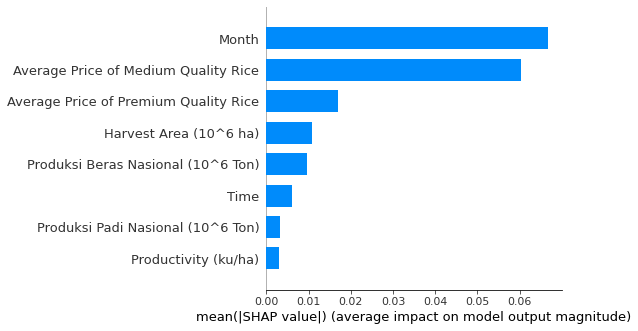

In [150]:
shap.summary_plot(shap_values, x_bad_train, plot_type="bar")

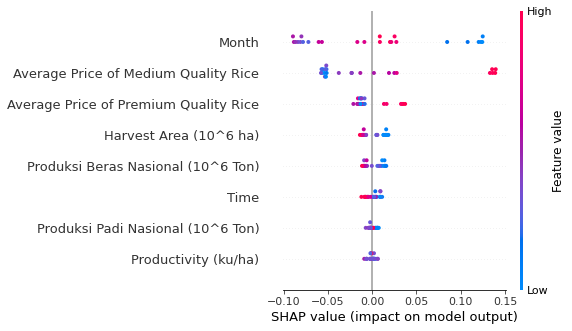

In [151]:
shap.summary_plot(shap_values, x_bad_train)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Bad Quality Rice is Month. High values of the Average Price of Medium Quality Rice variable have a high positive contribution on the prediction, while low values have a high negative contribution.

Shapley on Test Data

In [152]:
shap_values = explainer.shap_values(x_bad_test)

In [153]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, x_bad_test,link="logit")

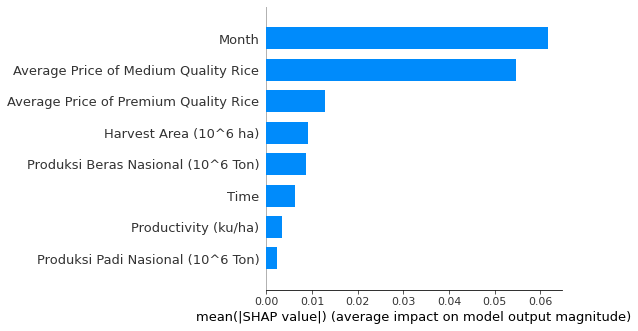

In [154]:
shap.summary_plot(shap_values, x_bad_test, plot_type="bar")

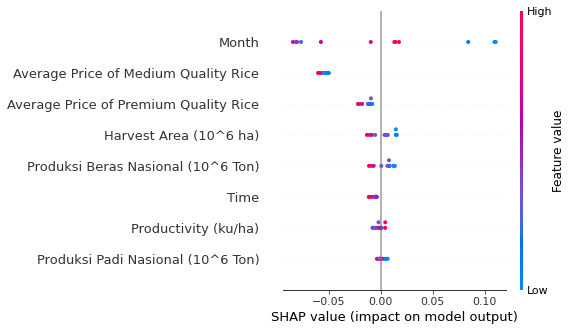

In [155]:
shap.summary_plot(shap_values, x_bad_test)

    The feature important that has the largest average SHAP value in the Random Forest Regression method on Average Price of Bad Quality Rice is Month. 

### explain the model's predictions using Lime

In [156]:
# Create the Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(x_bad_train.values, feature_names=x_bad_train.columns.values.tolist(),
                                                  class_names=['Average Price of Bad Quality Rice'], verbose=True, mode='regression')

In [157]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(x_bad_test.values[j], regressor3.predict, num_features=len(x_bad_test.columns.values.tolist()))

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Intercept 0.6703284474906872
Prediction_local [0.50691244]
Right: 0.48897144671855525


In [158]:
# Show the predictions
exp.show_in_notebook(show_table=True)

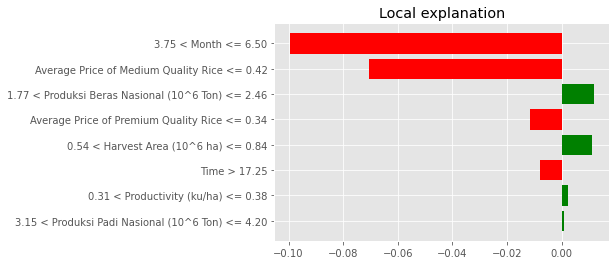

In [159]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

In [160]:
exp.as_list()

[('3.75 < Month <= 6.50', -0.09959563772266139),
 ('Average Price of Medium Quality Rice <= 0.42', -0.07062628299793214),
 ('1.77 < Produksi Beras Nasional (10^6 Ton) <= 2.46', 0.011833151531479357),
 ('Average Price of Premium Quality Rice <= 0.34', -0.011500675034885877),
 ('0.54 < Harvest Area (10^6 ha) <= 0.84', 0.011166060912325318),
 ('Time > 17.25', -0.00787516585337382),
 ('0.31 < Productivity (ku/ha) <= 0.38', 0.0023349251668966227),
 ('3.15 < Produksi Padi Nasional (10^6 Ton) <= 4.20', 0.0008476181412070441)]

Returns the MinMaxScaler value to get the actual data 

Premium Rice

In [161]:
HargaBerasPremium_test = HargaBerasPremium_test.to_numpy()
HargaBerasPremium_test = np.reshape(HargaBerasPremium_test, (-1,1)) 
HargaBerasPremium_test = mmscalar_premium.inverse_transform(HargaBerasPremium_test)
HargaBerasPremium_test = np.reshape(HargaBerasPremium_test, (12,))
HargaBerasPremium_test = pd.Series(HargaBerasPremium_test, index=x_premium_test.index)

In [162]:
AvgPricePremium_pred = AvgPricePremium_pred.to_numpy()
AvgPricePremium_pred = np.reshape(AvgPricePremium_pred, (-1,1)) 
AvgPricePremium_pred = mmscalar_premium.inverse_transform(AvgPricePremium_pred)
AvgPricePremium_pred = np.reshape(AvgPricePremium_pred, (12,))
AvgPricePremium_pred = pd.Series(AvgPricePremium_pred, index=x_premium_test.index)

In [163]:
AvgPricePremium_pred_v2 = AvgPricePremium_pred_v2.to_numpy()
AvgPricePremium_pred_v2 = np.reshape(AvgPricePremium_pred_v2, (-1,1)) 
AvgPricePremium_pred_v2 = mmscalar_premium.inverse_transform(AvgPricePremium_pred_v2)
AvgPricePremium_pred_v2 = np.reshape(AvgPricePremium_pred_v2, (12,))
AvgPricePremium_pred_v2 = pd.Series(AvgPricePremium_pred_v2, index=x_premium_test.index)

In [164]:
AvgPricePremium_pred_with_randomforest = AvgPricePremium_pred_with_randomforest.to_numpy()
AvgPricePremium_pred_with_randomforest = np.reshape(AvgPricePremium_pred_with_randomforest, (-1,1)) 
AvgPricePremium_pred_with_randomforest = mmscalar_premium.inverse_transform(AvgPricePremium_pred_with_randomforest)
AvgPricePremium_pred_with_randomforest = np.reshape(AvgPricePremium_pred_with_randomforest, (12,))
AvgPricePremium_pred_with_randomforest = pd.Series(AvgPricePremium_pred_with_randomforest, index=x_premium_test.index)

Medium

In [165]:
HargaBerasMedium_test = HargaBerasMedium_test.to_numpy()
HargaBerasMedium_test = np.reshape(HargaBerasMedium_test, (-1,1)) 
HargaBerasMedium_test = mmscalar_medium.inverse_transform(HargaBerasMedium_test)
HargaBerasMedium_test = np.reshape(HargaBerasMedium_test, (12,))
HargaBerasMedium_test = pd.Series(HargaBerasMedium_test, index=x_medium_test.index)

In [166]:
AvgPriceMedium_pred = AvgPriceMedium_pred.to_numpy()
AvgPriceMedium_pred = np.reshape(AvgPriceMedium_pred, (-1,1)) 
AvgPriceMedium_pred = mmscalar_medium.inverse_transform(AvgPriceMedium_pred)
AvgPriceMedium_pred = np.reshape(AvgPriceMedium_pred, (12,))
AvgPriceMedium_pred = pd.Series(AvgPriceMedium_pred, index=x_medium_test.index)

In [167]:
AvgPriceMedium_pred_v2 = AvgPriceMedium_pred_v2.to_numpy()
AvgPriceMedium_pred_v2 = np.reshape(AvgPriceMedium_pred_v2, (-1,1)) 
AvgPriceMedium_pred_v2 = mmscalar_medium.inverse_transform(AvgPriceMedium_pred_v2)
AvgPriceMedium_pred_v2 = np.reshape(AvgPriceMedium_pred_v2, (12,))
AvgPriceMedium_pred_v2 = pd.Series(AvgPriceMedium_pred_v2, index=x_medium_test.index)

In [168]:
AvgPriceMedium_pred_with_randomforest = AvgPriceMedium_pred_with_randomforest.to_numpy()
AvgPriceMedium_pred_with_randomforest = np.reshape(AvgPriceMedium_pred_with_randomforest, (-1,1)) 
AvgPriceMedium_pred_with_randomforest = mmscalar_medium.inverse_transform(AvgPriceMedium_pred_with_randomforest)
AvgPriceMedium_pred_with_randomforest = np.reshape(AvgPriceMedium_pred_with_randomforest, (12,))
AvgPriceMedium_pred_with_randomforest = pd.Series(AvgPriceMedium_pred_with_randomforest, index=x_medium_test.index)

Bad

In [169]:
HargaBerasLuarkualitas_test= HargaBerasLuarkualitas_test.to_numpy()
HargaBerasLuarkualitas_test= np.reshape(HargaBerasLuarkualitas_test, (-1,1)) 
HargaBerasLuarkualitas_test= mmscalar_bad.inverse_transform(HargaBerasLuarkualitas_test)
HargaBerasLuarkualitas_test= np.reshape(HargaBerasLuarkualitas_test, (12,))
HargaBerasLuarkualitas_test= pd.Series(HargaBerasLuarkualitas_test, index=x_bad_test.index)

In [170]:
AvgPriceBad_pred= AvgPriceBad_pred.to_numpy()
AvgPriceBad_pred= np.reshape(AvgPriceBad_pred, (-1,1)) 
AvgPriceBad_pred= mmscalar_bad.inverse_transform(AvgPriceBad_pred)
AvgPriceBad_pred= np.reshape(AvgPriceBad_pred, (12,))
AvgPriceBad_pred= pd.Series(AvgPriceBad_pred, index=x_bad_test.index)

In [171]:
AvgPriceBad_pred_v2= AvgPriceBad_pred_v2.to_numpy()
AvgPriceBad_pred_v2= np.reshape(AvgPriceBad_pred_v2, (-1,1)) 
AvgPriceBad_pred_v2= mmscalar_bad.inverse_transform(AvgPriceBad_pred_v2)
AvgPriceBad_pred_v2= np.reshape(AvgPriceBad_pred_v2, (12,))
AvgPriceBad_pred_v2= pd.Series(AvgPriceBad_pred_v2, index=x_bad_test.index)

In [172]:
AvgPriceBad_pred_with_randomforest= AvgPriceBad_pred_with_randomforest.to_numpy()
AvgPriceBad_pred_with_randomforest= np.reshape(AvgPriceBad_pred_with_randomforest, (-1,1)) 
AvgPriceBad_pred_with_randomforest= mmscalar_bad.inverse_transform(AvgPriceBad_pred_with_randomforest)
AvgPriceBad_pred_with_randomforest= np.reshape(AvgPriceBad_pred_with_randomforest, (12,))
AvgPriceBad_pred_with_randomforest= pd.Series(AvgPriceBad_pred_with_randomforest, index=x_bad_test.index)

### Collection of Visualizations

In [173]:
plt.style.use("seaborn-whitegrid")
plt.rc("figure", figsize=(11, 4))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

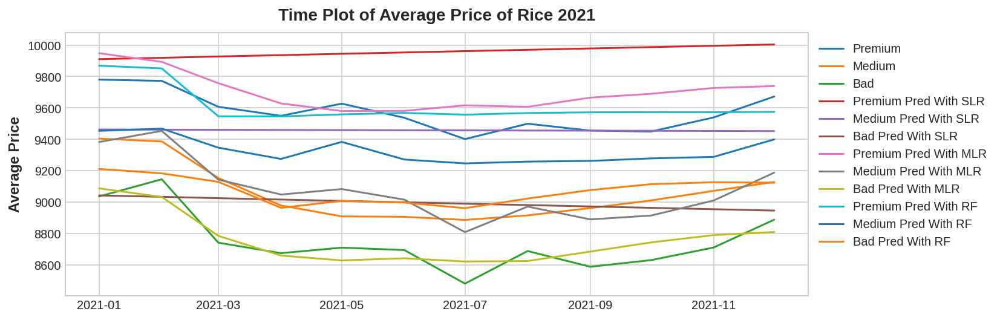

In [174]:
plt.plot(HargaBerasPremium_test,label='Premium') 
plt.plot(HargaBerasMedium_test,label='Medium') 
plt.plot(HargaBerasLuarkualitas_test,label='Bad')
plt.plot(AvgPricePremium_pred,label='Premium Pred With SLR')
plt.plot(AvgPriceMedium_pred,label='Medium Pred With SLR')
plt.plot(AvgPriceBad_pred,label='Bad Pred With SLR')
plt.plot(AvgPricePremium_pred_v2,label='Premium Pred With MLR')
plt.plot(AvgPriceMedium_pred_v2,label='Medium Pred With MLR')
plt.plot(AvgPriceBad_pred_v2,label='Bad Pred With MLR')
plt.plot(AvgPricePremium_pred_with_randomforest,label='Premium Pred With RF')
plt.plot(AvgPriceMedium_pred_with_randomforest,label='Medium Pred With RF')
plt.plot(AvgPriceBad_pred_with_randomforest,label='Bad Pred With RF')
plt.title('Time Plot of Average Price of Rice 2021' )
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

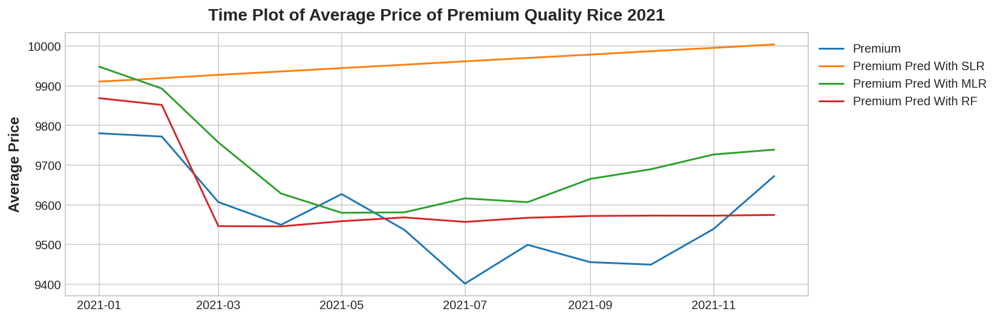

In [175]:
plt.plot(HargaBerasPremium_test,label='Premium') 
plt.plot(AvgPricePremium_pred,label='Premium Pred With SLR')
plt.plot(AvgPricePremium_pred_v2,label='Premium Pred With MLR')
plt.plot(AvgPricePremium_pred_with_randomforest,label='Premium Pred With RF')
plt.title('Time Plot of Average Price of Premium Quality Rice 2021')
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

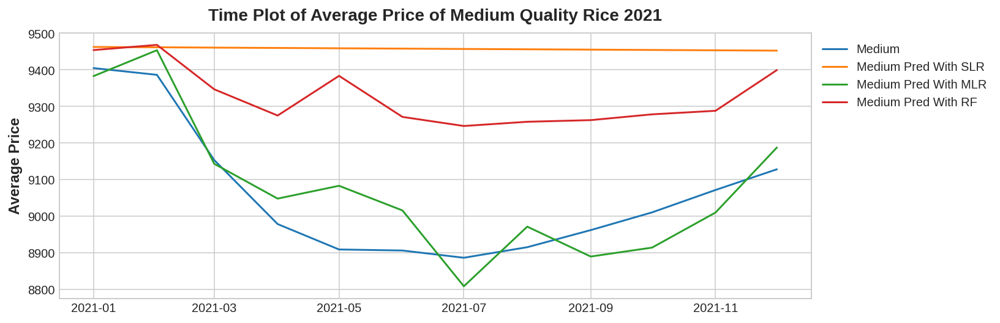

In [176]:
plt.plot(HargaBerasMedium_test,label='Medium') 
plt.plot(AvgPriceMedium_pred,label='Medium Pred With SLR')
plt.plot(AvgPriceMedium_pred_v2,label='Medium Pred With MLR')
plt.plot(AvgPriceMedium_pred_with_randomforest,label='Medium Pred With RF')
plt.title('Time Plot of Average Price of Medium Quality Rice 2021')
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

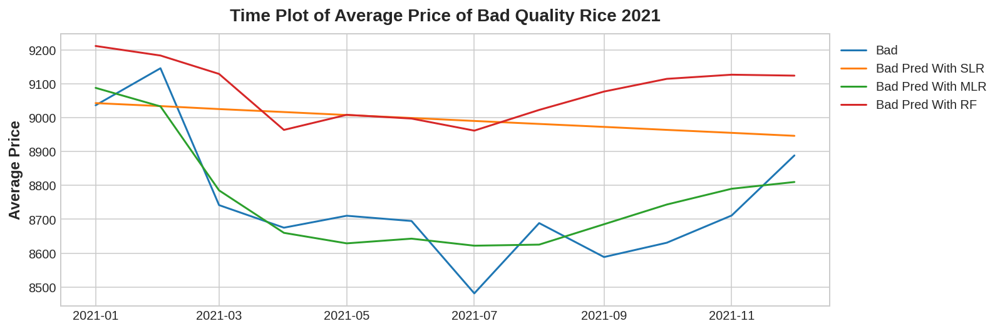

In [177]:
plt.plot(HargaBerasLuarkualitas_test,label='Bad')  
plt.plot(AvgPriceBad_pred,label='Bad Pred With SLR')
plt.plot(AvgPriceBad_pred_v2,label='Bad Pred With MLR')
plt.plot(AvgPriceBad_pred_with_randomforest,label='Bad Pred With RF')
plt.title('Time Plot of Average Price of Bad Quality Rice 2021' )
plt.ylabel("Average Price")
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper left')
plt.show()

Mean Absolute Error (MAE) 

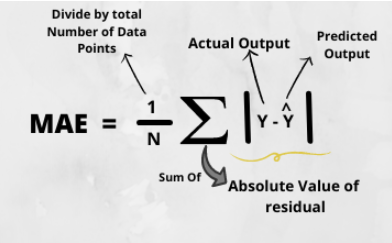

Mean Squared Error(MSE)

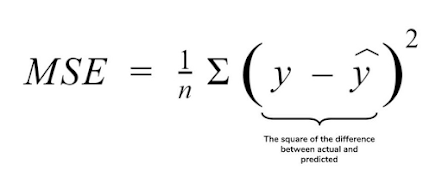

Mean Absolute Percentage Error (MAPE)

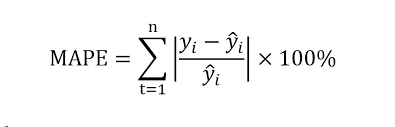

Root Mean Squared Error(RMSE) or root-mean-square deviation (RNSD)

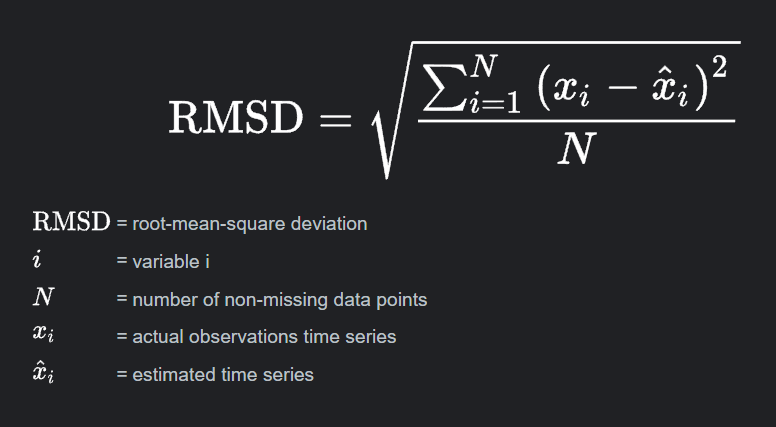


Root Mean Squared Log Error(RMSLE)

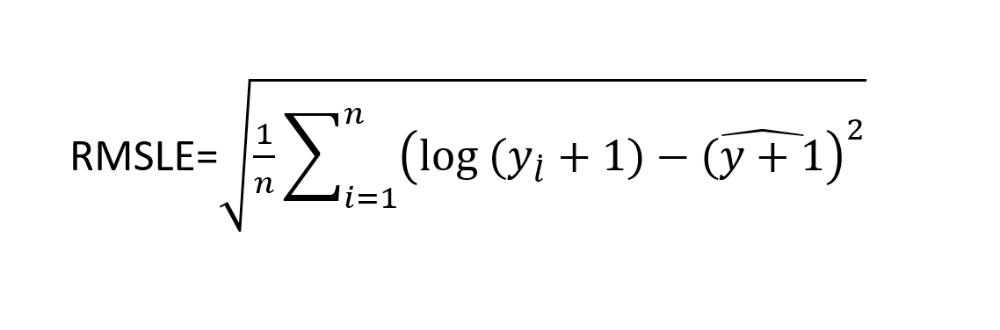

R Squared

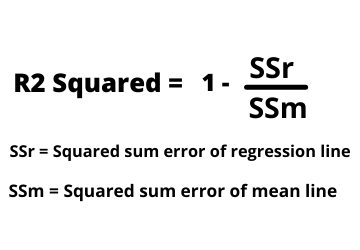

In [178]:
data_eval_train = pd.DataFrame(evaluation_train)
data_eval_train

,Train SLR Premium,Train MLR Premium,Train RF Premium,Train SLR Medium,Train MLR Medium,Train RF Medium,Train SLR Bad,Train MLR Bad,Train RF Bad
MAE,0.233959,0.067261,0.037994,0.185469,0.038925,0.023152,0.157171,0.046500,0.028629
MSE,0.075700,0.008279,0.002586,0.050945,0.002676,0.000800,0.035803,0.003555,0.001230
MAPE,0.859057,0.161144,0.093847,0.396696,0.078297,0.046743,0.259943,0.085626,0.051633
R squared,0.083376,0.899751,0.968686,0.000762,0.947514,0.984308,0.084751,0.909125,0.968569
RMSE,0.275136,0.090990,0.050854,0.225710,0.051730,0.028285,0.189217,0.059623,0.035065
RMSLE,-1.290491,-2.397010,-2.978802,-1.488503,-2.961726,-3.565436,-1.664863,-2.819720,-3.350563


In [179]:
data_eval_test = pd.DataFrame(evaluation_test)
data_eval_test

,Test SLR Premium,Test MLR Premium,Test RF Premium,Test SLR Medium,Test MLR Medium,Test RF Medium,Test SLR Bad,Test MLR Bad,Test RF Bad
MAE,5.398022e-01,1.920908e-01,1.088625e-01,3.915931e-01,7.182752e-02,2.638859e-01,2.499751e-01,7.327104e-02,3.101066e-01
MSE,3.277056e-01,4.550019e-02,1.519487e-02,1.814631e-01,6.714912e-03,8.243553e-02,7.907047e-02,6.372805e-03,1.114269e-01
MAPE,2.961654e+14,1.135942e+14,8.221428e+13,2.106280e+14,2.875866e+13,1.329196e+14,1.810027e+14,5.004714e+13,1.708540e+14
R squared,-1.111779e+01,-6.824906e-01,4.381292e-01,-5.340023e+00,7.653920e-01,-1.880162e+00,-1.737357e+00,7.793785e-01,-2.857512e+00
RMSE,5.724558e-01,2.133077e-01,1.232675e-01,4.259848e-01,8.194457e-02,2.871159e-01,2.811947e-01,7.982985e-02,3.338067e-01
RMSLE,-5.578198e-01,-1.545019e+00,-2.093399e+00,-8.533515e-01,-2.501712e+00,-1.247869e+00,-1.268708e+00,-2.527858e+00,-1.097193e+00
